In [21]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#### 2.1 Color-based segmentation

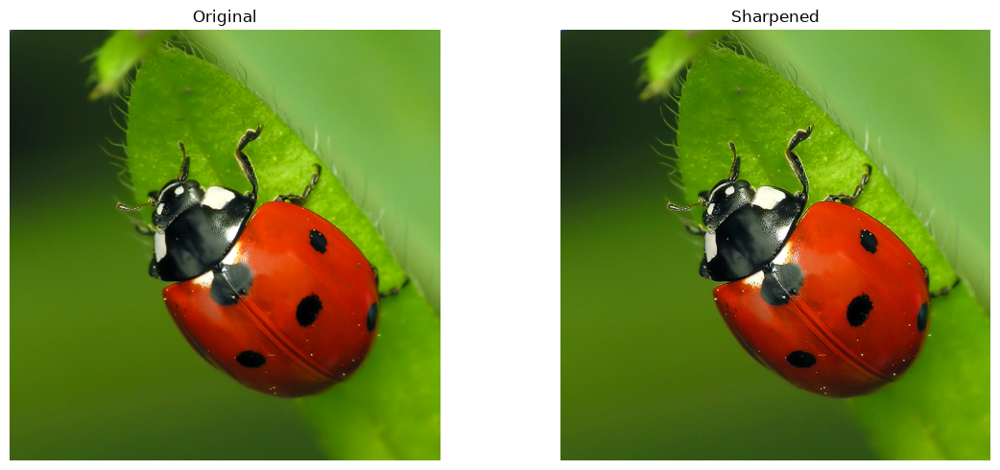

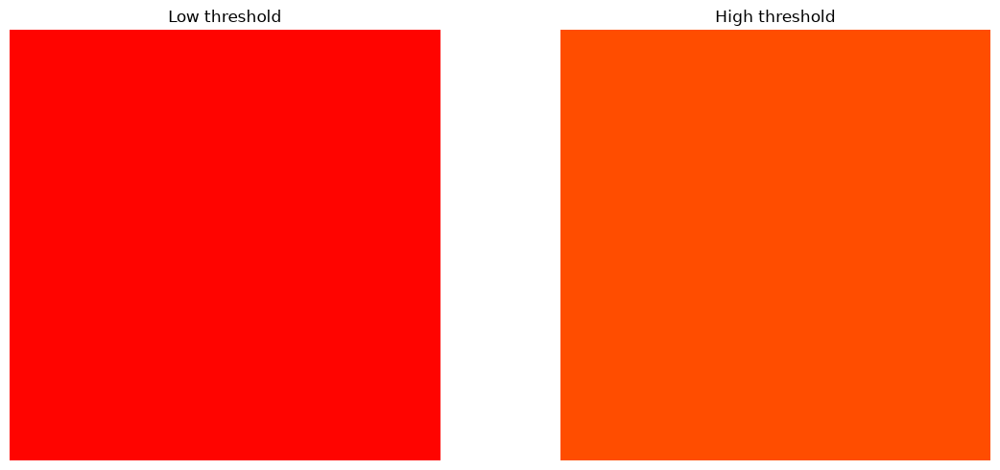

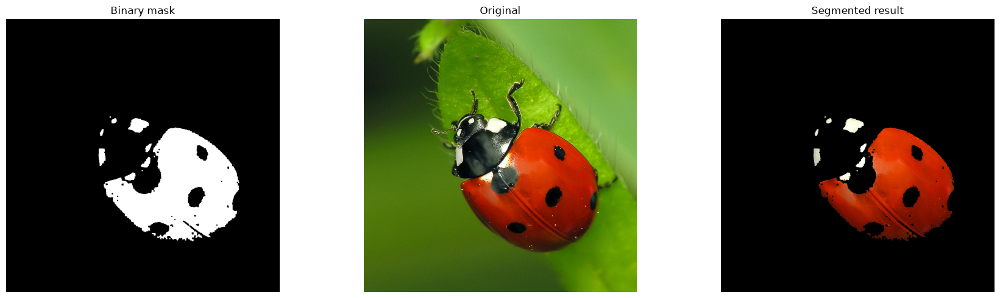

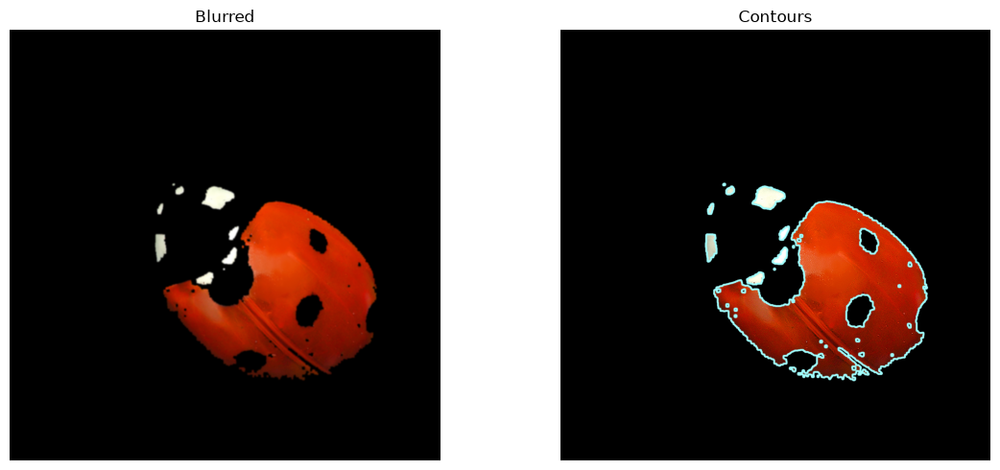

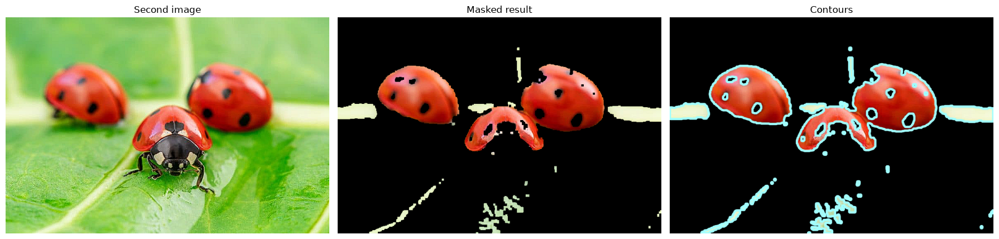

In [22]:
ladybug = cv2.imread("images/ladybug.jpg")
if ladybug is None:
    raise FileNotFoundError("Image not found: images/ladybug.jpg")
original_ladybug = cv2.cvtColor(ladybug, cv2.COLOR_BGR2RGB)

# Original image and sharpened version
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(original_ladybug)
axes[0].set_title("Original")
axes[0].axis("off")

kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]], dtype=np.float32)
ladybug = cv2.filter2D(original_ladybug, -1, kernel)
axes[1].imshow(ladybug)
axes[1].set_title("Sharpened")
axes[1].axis("off")
plt.tight_layout()
plt.show()

hsv_ladybug = cv2.cvtColor(ladybug, cv2.COLOR_RGB2HSV)

# HSV range for the red/orange region
low_red_1 = (0, 70, 70)
high_red_1 = (12, 255, 255)
low_red_2 = (170, 70, 70)
high_red_2 = (180, 255, 255)

# White tones range
low_white = (0, 0, 160)
high_white = (180, 60, 255)

# Demonstrate the selected color ranges
low_color_rgb = (255, 4, 0)
high_color_rgb = (255, 77, 0)

low_img = np.zeros((300, 300, 3), np.uint8)
low_img[:] = low_color_rgb
high_img = np.zeros((300, 300, 3), np.uint8)
high_img[:] = high_color_rgb

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(low_img)
axes[0].set_title("Low threshold")
axes[0].axis("off")
axes[1].imshow(high_img)
axes[1].set_title("High threshold")
axes[1].axis("off")
plt.tight_layout()
plt.show()

# Create the binary final mask from the red/orange and white regions
mask_red_1 = cv2.inRange(hsv_ladybug, low_red_1, high_red_1)
mask_red_2 = cv2.inRange(hsv_ladybug, low_red_2, high_red_2)
mask_white = cv2.inRange(hsv_ladybug, low_white, high_white)
mask_red = cv2.bitwise_or(mask_red_1, mask_red_2)
mask = cv2.bitwise_or(mask_red, mask_white)

# Clean the mask to reduce noise
morph_kernel = np.ones((5, 5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, morph_kernel)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, morph_kernel)
final_mask = mask.copy()

# Apply the mask
result = cv2.bitwise_and(ladybug, ladybug, mask=final_mask)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(final_mask, "gray")
axes[0].set_title("Binary mask")
axes[0].axis("off")
axes[1].imshow(ladybug)
axes[1].set_title("Original")
axes[1].axis("off")
axes[2].imshow(result)
axes[2].set_title("Segmented result")
axes[2].axis("off")
plt.tight_layout()
plt.show()

# Smooth the result before contour extraction
blur = cv2.GaussianBlur(result, (9, 9), 0)
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(blur)
axes[0].set_title("Blurred")
axes[0].axis("off")

# Detect contours based on the selected color region
contours, hierarchy = cv2.findContours(
    mask.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
)
result_with_contours = cv2.drawContours(
    result.copy(), contours, -1, (161, 255, 255), 3, cv2.LINE_AA, hierarchy, 1
)
axes[1].imshow(result_with_contours)
axes[1].set_title("Contours")
axes[1].axis("off")
plt.tight_layout()
plt.show()

# Check segmentation on the second image
bugs = cv2.cvtColor(cv2.imread("images/ladybug2.jpg"), cv2.COLOR_BGR2RGB)
if bugs is None:
    raise FileNotFoundError("Image not found: images/ladybug2.jpg")
bugs = cv2.filter2D(bugs, -1, kernel)

hsv_bugs = cv2.cvtColor(bugs, cv2.COLOR_RGB2HSV)
mask_red_1_2 = cv2.inRange(hsv_bugs, low_red_1, high_red_1)
mask_red_2_2 = cv2.inRange(hsv_bugs, low_red_2, high_red_2)
mask_white_2 = cv2.inRange(hsv_bugs, low_white, high_white)
mask2_red = cv2.bitwise_or(mask_red_1_2, mask_red_2_2)
mask2 = cv2.bitwise_or(mask2_red, mask_white_2)

mask2 = cv2.morphologyEx(mask2, cv2.MORPH_OPEN, morph_kernel)
mask2 = cv2.morphologyEx(mask2, cv2.MORPH_CLOSE, morph_kernel)

result2 = cv2.bitwise_and(bugs, bugs, mask=mask2)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
axes[0].imshow(bugs)
axes[0].set_title("Second image")
axes[0].axis("off")
axes[1].imshow(result2)
axes[1].set_title("Masked result")
axes[1].axis("off")

blur2 = cv2.GaussianBlur(result2, (9, 9), 0)
contours2, hierarchy2 = cv2.findContours(
    mask2.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE
)
result2_with_contours = cv2.drawContours(
    result2.copy(), contours2, -1, (161, 255, 255), 3, cv2.LINE_AA, hierarchy2, 1
)
axes[2].imshow(result2_with_contours)
axes[2].set_title("Contours")
axes[2].axis("off")
plt.tight_layout()
plt.show()


#### 2.2 Morphological watershed method

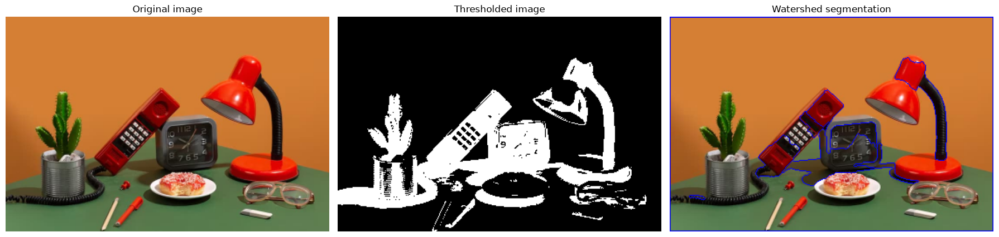

In [23]:
# Load the image
img = cv2.imread('images/objects-table.jpg')
if img is None:
    raise FileNotFoundError("Image not found: images/objects-table.jpg")
img = cv2.resize(img, (0, 0), fx=0.5, fy=0.5)

# Convert to grayscale and threshold the image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Morphological opening to remove small noise
kernel = np.ones((3, 3), dtype=np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

# Estimate background and foreground regions
sure_bg = cv2.dilate(opening, kernel, iterations=3)
distance_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(distance_transform, 0.7 * distance_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# Create markers for watershed
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# Watershed segmentation
watershed_img = img.copy()
cv2.watershed(watershed_img, markers)
watershed_img[markers == -1] = [255, 0, 0]

# Visualize the results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Original image')
axes[0].axis('off')

axes[1].imshow(thresh, cmap='gray')
axes[1].set_title('Thresholded image')
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(watershed_img, cv2.COLOR_BGR2RGB))
axes[2].set_title('Watershed segmentation')
axes[2].axis('off')

plt.tight_layout()
plt.show()

#### 2.3 Distance Transform and Watershed algorithms.

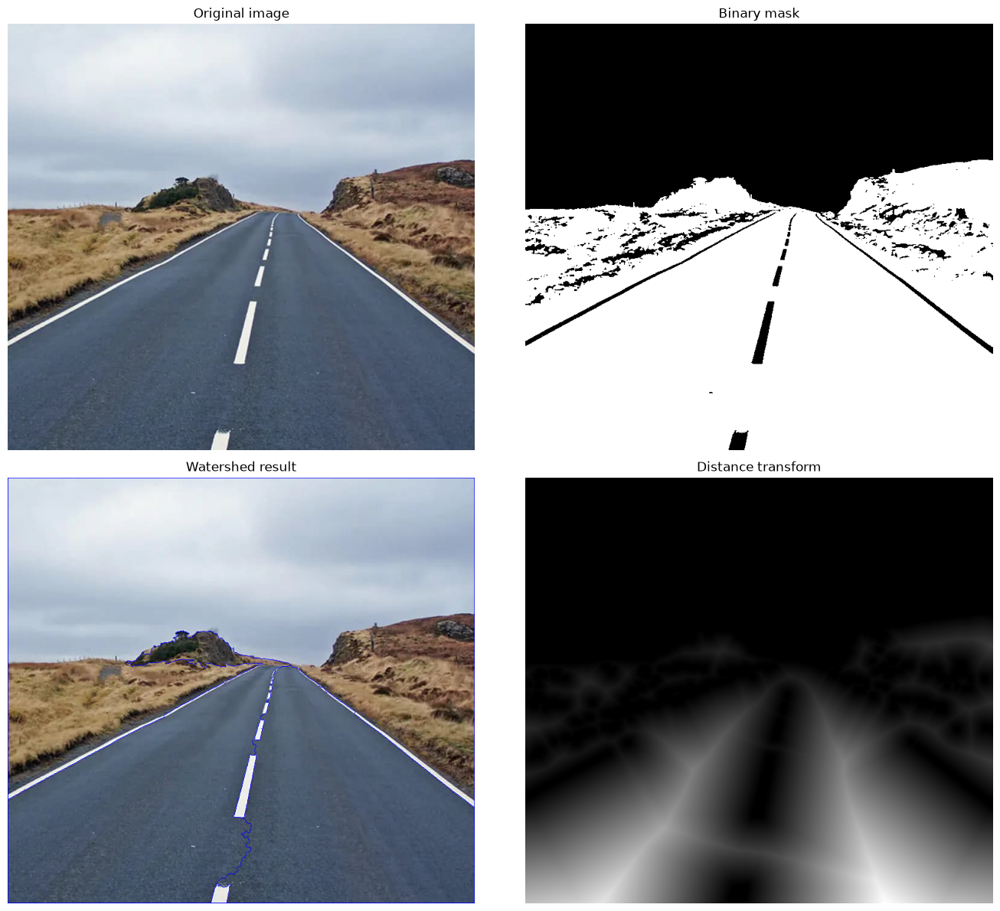

In [24]:
# Load the source image
img = cv2.imread("images/road.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/road.jpg")

# Convert the image to RGB for plotting in matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Remove possible white background pixels before watershed marker generation
img[np.all(img == 255, axis=2)] = 0

# Convert to grayscale and threshold to separate objects from the background
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Clean the mask with morphology
kernel = np.ones((3, 3), dtype=np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)

# Estimate background and foreground regions
after_dilate = cv2.dilate(closing, kernel, iterations=3)
distance = cv2.distanceTransform(closing, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(distance, 0.5 * distance.max(), 255, 0)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(after_dilate, sure_fg)

# Create markers for watershed
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

# Apply watershed labeling
after_watershed = img.copy()
cv2.watershed(after_watershed, markers)
after_watershed[markers == -1] = [255, 0, 0]

# Plot all stages for inspection
fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("Original image")
axes[0, 0].axis("off")

axes[0, 1].imshow(binary, cmap="gray")
axes[0, 1].set_title("Binary mask")
axes[0, 1].axis("off")

axes[1, 0].imshow(cv2.cvtColor(after_watershed, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title("Watershed result")
axes[1, 0].axis("off")

axes[1, 1].imshow(distance, cmap="gray")
axes[1, 1].set_title("Distance transform")
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

#### 2.4 Segmentation using the Canny function

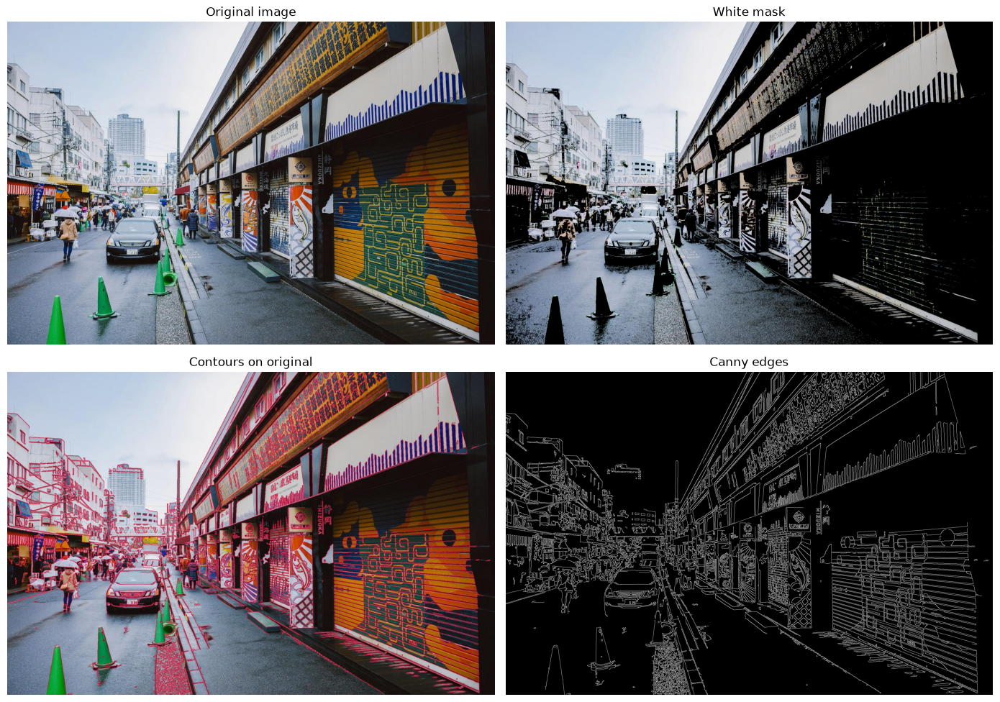

In [25]:
# Load the image
img = cv2.imread("images/nippon-street.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/nippon-street.jpg")

# Convert BGR -> RGB for correct display in matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# White/bright object segmentation in HSV space
hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
light_white = (0, 0, 80)
dark_white = (180, 80, 255)
mask_white = cv2.inRange(hsv_image, light_white, dark_white)
white_masked = cv2.bitwise_and(img, img, mask=mask_white)
white_masked_rgb = cv2.cvtColor(white_masked, cv2.COLOR_BGR2RGB)

# Prepare grayscale image for Canny edge detection
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Use a balanced Canny threshold for better edge response
edges = cv2.Canny(blurred, 50, 150, L2gradient=True)

# Detect and draw contours on the original image
contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contour_image = img.copy()
cv2.drawContours(contour_image, contours, -1, (60, 20, 220), 1, cv2.LINE_AA, hierarchy, 5)
contour_image_rgb = cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB)

# Display all stages in a clean 2x2 layout
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("Original image")
axes[0, 0].axis("off")

axes[0, 1].imshow(white_masked_rgb)
axes[0, 1].set_title("White mask")
axes[0, 1].axis("off")

axes[1, 0].imshow(contour_image_rgb)
axes[1, 0].set_title("Contours on original")
axes[1, 0].axis("off")

axes[1, 1].imshow(edges, cmap="gray")
axes[1, 1].set_title("Canny edges")
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

#### 2.5 Segmentation algorithms, including QuickShift

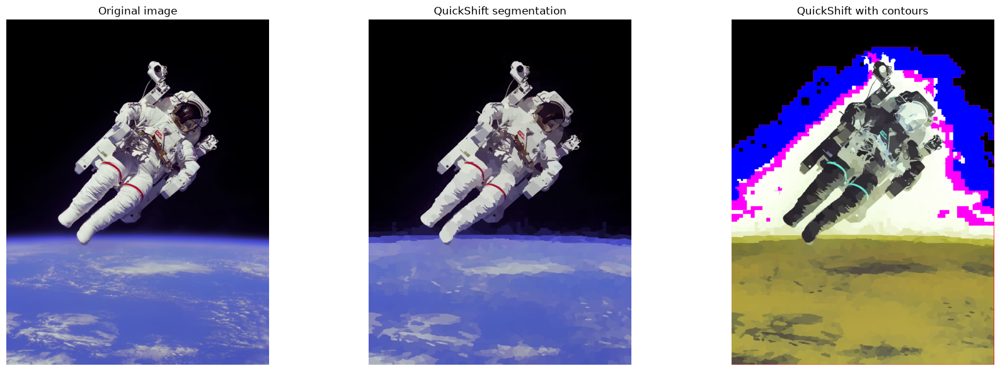

In [26]:
from skimage.segmentation import quickshift
from skimage.color import label2rgb

# Load image
img = cv2.imread("images/astronaut.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/astronaut.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Run QuickShift on the RGB image
segments = quickshift(img_rgb, kernel_size=3, max_dist=10, ratio=0.5)
segmented = label2rgb(segments, img_rgb, kind='avg', bg_label=0)

# Show comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(segmented)
axes[1].set_title("QuickShift segmentation")
axes[1].axis("off")

# Add contours for clearer visual separation
gray = cv2.cvtColor(np.uint8(segmented * 255), cv2.COLOR_RGB2GRAY)
contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_image = cv2.cvtColor(np.uint8(segmented * 255), cv2.COLOR_RGB2BGR)
cv2.drawContours(contour_image, contours, -1, (0, 0, 255), 1)
axes[2].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
axes[2].set_title("QuickShift with contours")
axes[2].axis("off")

plt.tight_layout()
plt.show()

#### 2.6 Mean Shift segmentation algorithm

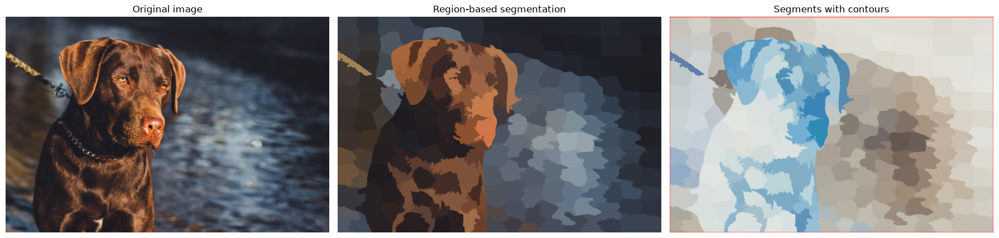

In [27]:
from skimage.segmentation import slic
from skimage.color import label2rgb

# Load image
img = cv2.imread("images/labrador.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/labrador.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mean Shift is not available directly in scikit-image, so we use SLIC as a
# close region-based segmentation method for demonstration in this notebook.
segments = slic(img_rgb, n_segments=200, compactness=20, sigma=1, start_label=1)
segmented = label2rgb(segments, img_rgb, kind='avg', bg_label=0)

# Show original and segmented result
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(img_rgb)
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(segmented)
axes[1].set_title("Region-based segmentation")
axes[1].axis("off")

# Contours for clearer separation
gray = cv2.cvtColor(np.uint8(segmented * 255), cv2.COLOR_RGB2GRAY)
contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contour_image = cv2.cvtColor(np.uint8(segmented * 255), cv2.COLOR_RGB2BGR)
cv2.drawContours(contour_image, contours, -1, (0, 0, 255), 1)
axes[2].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
axes[2].set_title("Segments with contours")
axes[2].axis("off")

plt.tight_layout()
plt.show()

#### 2.7 Segmentation using edge and contour detection

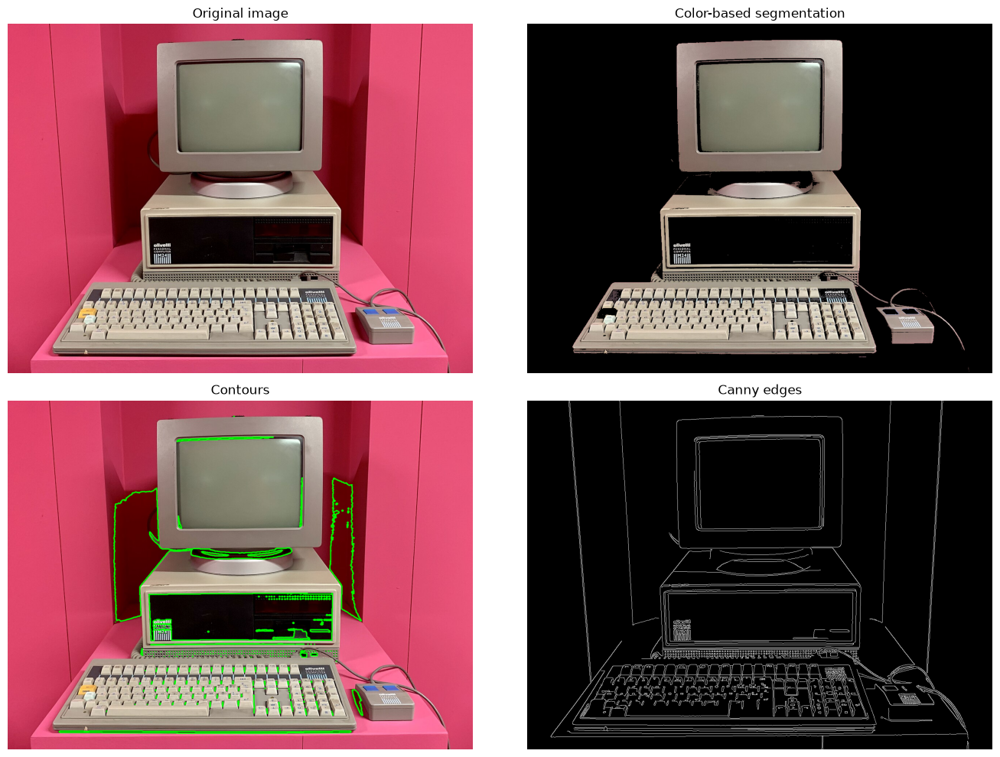

In [28]:
# Load an available image from the project
img = cv2.imread("images/olivetti.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/olivetti.jpg")

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Convert to grayscale and smooth to reduce noise before edge detection
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Binary threshold for simple contour extraction
_, binary = cv2.threshold(blurred, 30, 255, cv2.THRESH_BINARY_INV)

# Find contours on the binary image
contours, hierarchy = cv2.findContours(binary.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contour_image = img.copy()
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2, cv2.LINE_AA, hierarchy, 1)

# Canny edge detection for thin edges
edges = cv2.Canny(blurred, 50, 150, L2gradient=True)

# Optional color-based region mask for bright foreground objects
hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
low_white = (0, 0, 80)
high_white = (180, 80, 255)
mask_white = cv2.inRange(hsv_img, low_white, high_white)
segmented = cv2.bitwise_and(img, img, mask=mask_white)
segmented_rgb = cv2.cvtColor(segmented, cv2.COLOR_BGR2RGB)

# Display all results in one layout
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("Original image")
axes[0, 0].axis("off")

axes[0, 1].imshow(segmented_rgb)
axes[0, 1].set_title("Color-based segmentation")
axes[0, 1].axis("off")

axes[1, 0].imshow(cv2.cvtColor(contour_image, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title("Contours")
axes[1, 0].axis("off")

axes[1, 1].imshow(edges, cmap="gray")
axes[1, 1].set_title("Canny edges")
axes[1, 1].axis("off")

plt.tight_layout()
plt.show()

#### 2.8 Superpixel segmentation SEEDS, SLIC, SLICO, MSLIC

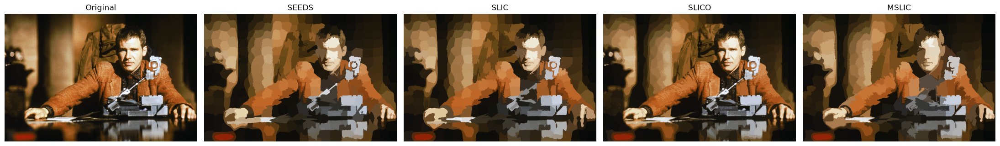

In [29]:
from skimage.segmentation import slic
from skimage.color import label2rgb

# Load image
img = cv2.imread("images/runner.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/runner.jpg")

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# OpenCV contrib superpixel methods are not available in this environment,
# so we use a robust fallback: when cv2.ximgproc is installed, the code uses the
# native OpenCV implementations; otherwise it falls back to skimage SLIC-based
# variations that produce visually similar superpixel outputs.
results = {}

if hasattr(cv2, "ximgproc"):
    ximg = cv2.ximgproc

    if hasattr(ximg, "createSuperpixelSEEDS"):
        seeds = ximg.createSuperpixelSEEDS(
            img.shape[1], img.shape[0], img.shape[2],
            number_of_superpixels=400,
            use_single_thread=False,
            prior=2,
            histogram_bins=5,
            double_step=False,
        )
        seeds.iterate(img, num_iterations=3)
        labels = seeds.getLabels()
        results["SEEDS"] = label2rgb(labels, img_rgb, kind="avg", bg_label=0)

    if hasattr(ximg, "createSuperpixelSLIC"):
        slic_op = ximg.createSuperpixelSLIC(img, algorithm=ximg.SLIC, region_size=20, ruler=20.0)
        slic_op.iterate(5)
        labels = slic_op.getLabels()
        results["SLIC"] = label2rgb(labels, img_rgb, kind="avg", bg_label=0)

        slico_op = ximg.createSuperpixelSLIC(img, algorithm=ximg.SLICO, region_size=20, ruler=20.0)
        slico_op.iterate(5)
        labels = slico_op.getLabels()
        results["SLICO"] = label2rgb(labels, img_rgb, kind="avg", bg_label=0)

    if hasattr(ximg, "createSuperpixelMSLIC"):
        mslic_op = ximg.createSuperpixelMSLIC(img, region_size=20, ruler=20.0)
        mslic_op.iterate(5)
        labels = mslic_op.getLabels()
        results["MSLIC"] = label2rgb(labels, img_rgb, kind="avg", bg_label=0)

# Fallback for environments without OpenCV contrib modules
if not results:
    results["SEEDS"] = label2rgb(
        slic(img_rgb, n_segments=350, compactness=18, sigma=1, start_label=1, enforce_connectivity=True),
        img_rgb, kind="avg", bg_label=0,
    )
    results["SLIC"] = label2rgb(
        slic(img_rgb, n_segments=350, compactness=20, sigma=1, start_label=1, enforce_connectivity=True),
        img_rgb, kind="avg", bg_label=0,
    )
    results["SLICO"] = label2rgb(
        slic(img_rgb, n_segments=400, compactness=8, sigma=1, start_label=1, enforce_connectivity=False),
        img_rgb, kind="avg", bg_label=0,
    )
    results["MSLIC"] = label2rgb(
        slic(img_rgb, n_segments=300, compactness=10, sigma=1, start_label=1, enforce_connectivity=True),
        img_rgb, kind="avg", bg_label=0,
    )

# Keep a consistent order for the plot
method_order = ["SEEDS", "SLIC", "SLICO", "MSLIC"]
fig, axes = plt.subplots(1, 5, figsize=(22, 5))

axes[0].imshow(img_rgb)
axes[0].set_title("Original")
axes[0].axis("off")

for ax, name in zip(axes[1:], method_order):
    if name not in results:
        continue
    ax.imshow(results[name])
    ax.set_title(name)
    ax.axis("off")

plt.tight_layout()
plt.show()


#### 2.9 Application of the Mask R-CNN neural network for segmentation

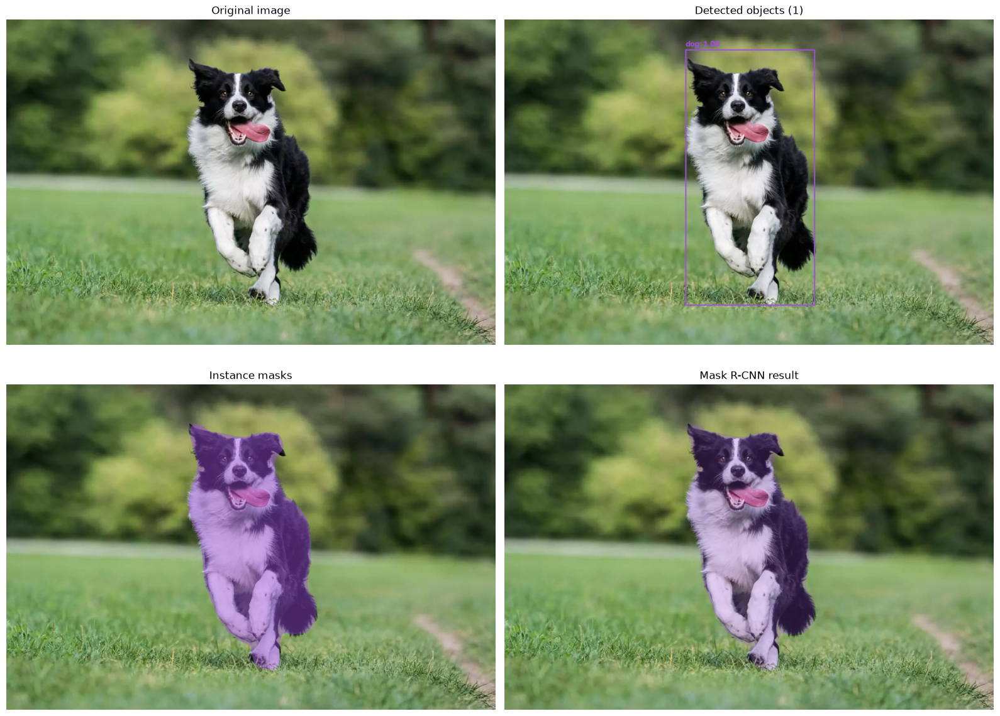

Device: cpu
Detected objects:
- dog: 1.00


In [30]:
import torch
from torchvision.models.detection import (
    maskrcnn_resnet50_fpn,
    MaskRCNN_ResNet50_FPN_Weights,
)

# Load image
img = cv2.imread("images/collie.jpg")
if img is None:
    raise FileNotFoundError("Image not found: images/collie.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Load the COCO-pretrained Mask R-CNN model
weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
model = maskrcnn_resnet50_fpn(weights=weights).eval()
_device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(_device)

# Prepare the image tensor and run instance segmentation
image_tensor = torch.from_numpy(img_rgb).permute(2, 0, 1).float() / 255.0
with torch.inference_mode():
    prediction = model([image_tensor.to(_device)])[0]

class_names = weights.meta["categories"]
score_threshold = 0.65
keep = prediction["scores"] >= score_threshold
boxes = prediction["boxes"][keep].cpu().numpy().astype(int)
labels = prediction["labels"][keep].cpu().numpy()
scores = prediction["scores"][keep].cpu().numpy()
masks = prediction["masks"][keep, 0].cpu().numpy() >= 0.5

# Render each instance with a mask, bounding box, and class label
rng = np.random.default_rng(42)
colors = rng.integers(50, 256, size=(len(boxes), 3), dtype=np.uint8)
mask_image = img_rgb.copy()
detection_image = img_rgb.copy()

for box, label, score, mask, color in zip(boxes, labels, scores, masks, colors):
    x1, y1, x2, y2 = box
    mask_image[mask] = (
        0.55 * mask_image[mask].astype(np.float32)
        + 0.45 * color.astype(np.float32)
    ).astype(np.uint8)
    cv2.rectangle(detection_image, (x1, y1), (x2, y2), color.tolist(), 2)
    cv2.putText(
        detection_image,
        f"{class_names[label]}: {score:.2f}",
        (x1, max(y1 - 8, 20)),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.65,
        color.tolist(),
        2,
        cv2.LINE_AA,
    )

overlay = cv2.addWeighted(img_rgb, 0.45, mask_image, 0.55, 0)

# Display the original image, detections, masks, and combined result
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
visualizations = [
    (img_rgb, "Original image"),
    (detection_image, f"Detected objects ({len(boxes)})"),
    (mask_image, "Instance masks"),
    (overlay, "Mask R-CNN result"),
]
for axis, (image, title) in zip(axes.flat, visualizations):
    axis.imshow(image)
    axis.set_title(title)
    axis.axis("off")
plt.tight_layout()
plt.show()

print(f"Device: {_device}")
print("Detected objects:")
for label, score in zip(labels, scores):
    print(f"- {class_names[label]}: {score:.2f}")
